In [1]:
import numpy as np
import pandas as pd
from anndata import AnnData
import scanpy as sc, anndata as ad
import scanpy.external as sce
import matplotlib.pyplot as plt
import seaborn as sns

import scdrs

from tqdm import tqdm

import statsmodels.api as sm
import statsmodels.stats.multitest as multi

seed = 0
np.random.seed(seed)

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42


# In[230]:


sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_header()

version = 'pbmc_raw_adj-prop'


import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)

sc.settings.figdir = '../scanpy/{}/graph'.format(version)
sc.settings.cachedir = '../scanpy/{}/cache'.format(version)
# %config InlineBackend.figure_format = 'retina'

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)
os.makedirs(sc.settings.figdir, exist_ok=True)

scanpy==1.8.1 anndata==0.7.6 umap==0.5.1 numpy==1.20.3 scipy==1.7.1 pandas==1.3.3 scikit-learn==0.24.2 statsmodels==0.13.0rc0 python-igraph==0.9.6 pynndescent==0.5.4


In [7]:
adata = sc.read('../scanpy/pbmc/pbmc.h5ad')
adata

AnnData object with n_obs × n_vars = 2638 × 32738
    obs: 'cell_type', 'n_genes'
    var: 'gene_ids'
    obsm: 'X_draw_graph_fr', 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'connectivities', 'distances'

In [3]:
df_traits = pd.read_csv('../data/supp_table/trait_info.tsv', sep='\t')
df_traits.head()

,Trait Name,Trait_Identifier,Code,Category,Reference,N,M,h2g,sd,Z,Intercept,log10 Me Common
0,Crohn's Disease,PASS_CD_deLange2017,CD,blood/immune,de Lange et al. 2017 Nat Genet,40266,1150097,0.4152,0.0361,11.501385,1.1010,NaN
1,Celiac Disease,PASS_Celiac,Celiac,blood/immune,"Dubois et al., 2010 Nat Genet",15283,245449,0.3296,0.0697,4.728838,1.0528,NaN
2,Inflammatory Bowel Disease,PASS_IBD_deLange2017,IBD,blood/immune,de Lange et al. 2017 Nat Genet,59957,1150510,0.3206,0.0243,13.193416,1.1216,3.60 (0.04)
3,Systemic Lupus Erythematosus,PASS_Lupus,SLE,blood/immune,"Bentham et al., 2015 Nat Genet",14267,654940,0.4584,0.0957,4.789969,1.0899,NaN
4,Multiple Sclerosis,PASS_Multiple_sclerosis,MS,blood/immune,"IMS Genetics Consortium, 2011 Nature",27148,227549,0.0812,0.0373,2.176944,1.0416,NaN


In [8]:
! seq 0 14 | xargs -P15 -I{} bash ../scripts/scDRS_batch_nofilter_adj-prop_pbmc.sh {}

+ mkdir -p ../scanpy/pbmc/scDRS_nofilter_adj-prop
+ mkdir -p ../scanpy/pbmc/scDRS_nofilter_adj-prop
+ mkdir -p ../scanpy/pbmc/scDRS_nofilter_adj-prop
+ mkdir -p ../scanpy/pbmc/scDRS_nofilter_adj-prop
+ scdrs compute-score --h5ad-file ../scanpy/pbmc/pbmc.h5ad --h5ad-species human --gs-file ../data/gs_file/magma_10kb_top1000_zscore.75_traits.batch/batch0.gs --gs-species human --cov-file ../scanpy/pbmc/pbmc.cov.tsv --flag-filter-data False --flag-raw-count True --flag-return-ctrl-raw-score False --flag-return-ctrl-norm-score True --adj-prop cell_type --out-folder ../scanpy/pbmc/scDRS_nofilter_adj-prop
+ mkdir -p ../scanpy/pbmc/scDRS_nofilter_adj-prop
+ scdrs compute-score --h5ad-file ../scanpy/pbmc/pbmc.h5ad --h5ad-species human --gs-file ../data/gs_file/magma_10kb_top1000_zscore.75_traits.batch/batch1.gs --gs-species human --cov-file ../scanpy/pbmc/pbmc.cov.tsv --flag-filter-data False --flag-raw-count True --flag-return-ctrl-raw-score False --flag-return-ctrl-norm-score True --adj-prop 

In [8]:
dict_score = {
    row['Trait Name']: pd.read_csv(f"../scanpy/pbmc/scDRS_nofilter/{row['Trait_Identifier']}.full_score.gz", 
    sep="\t", index_col=0)
    for pos,row in df_traits.iterrows()
}

# dict_score = {
#     row['Trait Name']: pd.read_csv(f"../scanpy/pbmc/scDRS_nofilter_magic/{row['Trait_Identifier']}.full_score.gz", 
#     sep="\t", index_col=0)
#     for pos,row in df_traits.iterrows()
# }

for trait in dict_score:
    adata.obs[trait] = dict_score[trait]["norm_score"]

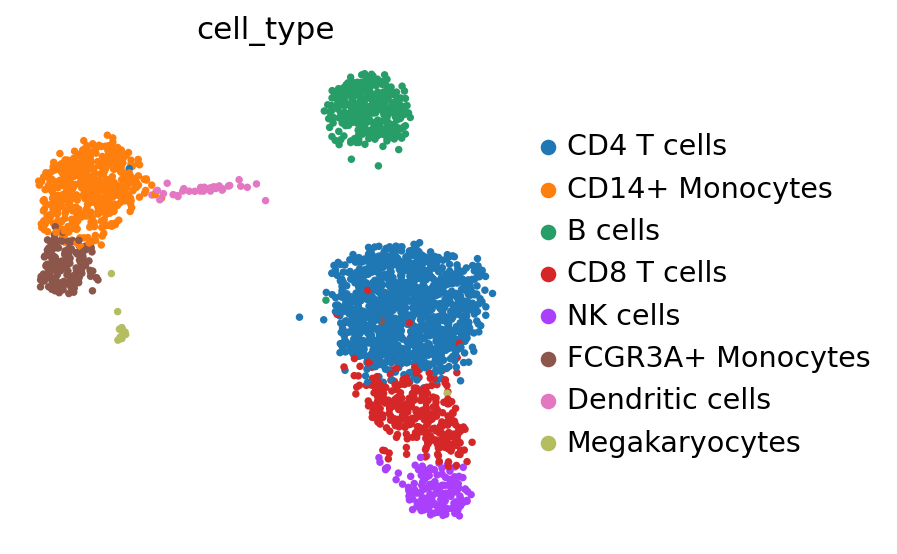

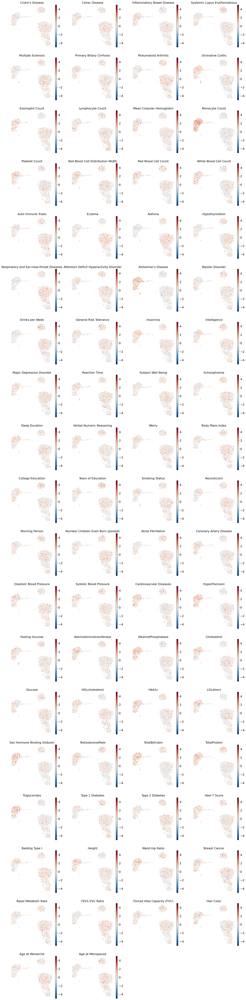

In [19]:
sc.pl.umap(
    adata,
    color="cell_type",
    ncols=1,
    vmin=-5,
    vmax=5,
    save='celltype.png'
)

sc.pl.umap(
    adata,
    color=dict_score.keys(),
    color_map="RdBu_r",
    vmin=-5,
    vmax=5,
    s=20,
    save='disease_scores_raw.png'
)

%%capture

for trait in df_traits['Trait_Identifier']:
    print(```scdrs perform-downstream \
        --h5ad-file ../scanpy/220929_scDRS_various/pbmc.h5ad \
        --score-file ../scanpy/220929_scDRS_various/pbmc/scDRS/{trait}.full_score.gz \
        --out-folder ../scanpy/220929_scDRS_various/pbmc/scDRS \
        --group-analysis cell_type \
        --flag-filter-data True \
        --flag-raw-count True &```)

In [16]:
for trait in df_traits['Trait_Identifier']:
    print('''scdrs perform-downstream \
        --h5ad-file ../scanpy/pbmc/pbmc.h5ad \
        --score-file ../scanpy/pbmc/scDRS_nofilter/{}.full_score.gz \
        --out-folder ../scanpy/pbmc/scDRS_nofilter \
        --group-analysis cell_type \
        --flag-filter-data False \
        --flag-raw-count True &'''.format(trait))

scdrs perform-downstream         --h5ad-file ../scanpy/pbmc/pbmc.h5ad         --score-file ../scanpy/pbmc/scDRS_nofilter/PASS_CD_deLange2017.full_score.gz         --out-folder ../scanpy/pbmc/scDRS_nofilter         --group-analysis cell_type         --flag-filter-data False         --flag-raw-count True &
scdrs perform-downstream         --h5ad-file ../scanpy/pbmc/pbmc.h5ad         --score-file ../scanpy/pbmc/scDRS_nofilter/PASS_Celiac.full_score.gz         --out-folder ../scanpy/pbmc/scDRS_nofilter         --group-analysis cell_type         --flag-filter-data False         --flag-raw-count True &
scdrs perform-downstream         --h5ad-file ../scanpy/pbmc/pbmc.h5ad         --score-file ../scanpy/pbmc/scDRS_nofilter/PASS_IBD_deLange2017.full_score.gz         --out-folder ../scanpy/pbmc/scDRS_nofilter         --group-analysis cell_type         --flag-filter-data False         --flag-raw-count True &
scdrs perform-downstream         --h5ad-file ../scanpy/pbmc/pbmc.h5ad         --score-fil

In [17]:
dict_df_stats = {
    row['Trait Name']: pd.read_csv(f"../scanpy/pbmc/scDRS_nofilter/{row['Trait_Identifier']}.scdrs_group.cell_type", 
    sep="\t", index_col=0)
    for pos,row in df_traits.iterrows()
}

# dict_df_stats = {
#     row['Trait Name']: pd.read_csv(f"../scanpy/pbmc/scDRS_nofilter_magic/{row['Trait_Identifier']}.scdrs_group.cell_type", 
#     sep="\t", index_col=0)
#     for pos,row in df_traits.iterrows()
# }

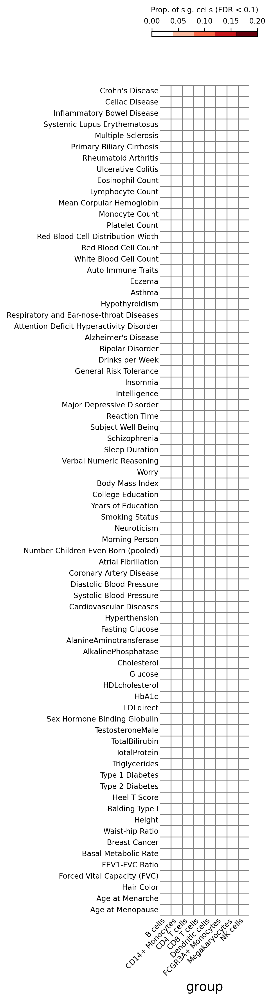

In [20]:
scdrs.util.plot_group_stats(
    {
        trait: df_stats
        for trait, df_stats in dict_df_stats.items()
    }
)
plt.savefig(str(sc.settings.figdir)+'/heatmap_raw.png', bbox_inches='tight')